In [53]:
import pandas as pd
import joblib
import seaborn as sns


%config InlineBackend.figure_format = "retina"

# For the Decision Tree model
with open('dt_roc_data.pkl', 'rb') as f:
    dt_data = joblib.load(f)
    fpr_dt_unbal = dt_data['fpr_unbal']
    tpr_dt_unbal = dt_data['tpr_unbal']
    roc_auc_dt_unbal = dt_data['roc_auc1']
    fpr_dt_bal = dt_data['fpr_bal']
    tpr_dt_bal = dt_data['tpr_bal']
    roc_auc_dt_bal = dt_data['roc_auc2']

# For the Logistic Regression model
with open('logreg_roc_data.pkl', 'rb') as f:
    lr_data = joblib.load(f)
    fpr_lr_unbal = lr_data['fpr_unbal']
    tpr_lr_unbal = lr_data['tpr_unbal']
    roc_auc_lr_unbal = lr_data['roc_auc1']
    fpr_lr_bal = lr_data['fpr_bal']
    tpr_lr_bal = lr_data['tpr_bal']
    roc_auc_lr_bal = lr_data['roc_auc2']

# For the randfor model
with open('ranfor_roc_data.pkl', 'rb') as f:
    randfor_data = joblib.load(f)
    fpr_rf_unbal = randfor_data['fpr_unbal']
    tpr_rf_unbal = randfor_data['tpr_unbal']
    roc_auc_rf_unbal = randfor_data['roc_auc1']
    fpr_rf_bal = randfor_data['fpr_bal']
    tpr_rf_bal = randfor_data['tpr_bal']
    roc_auc_rf_bal = randfor_data['roc_auc2']


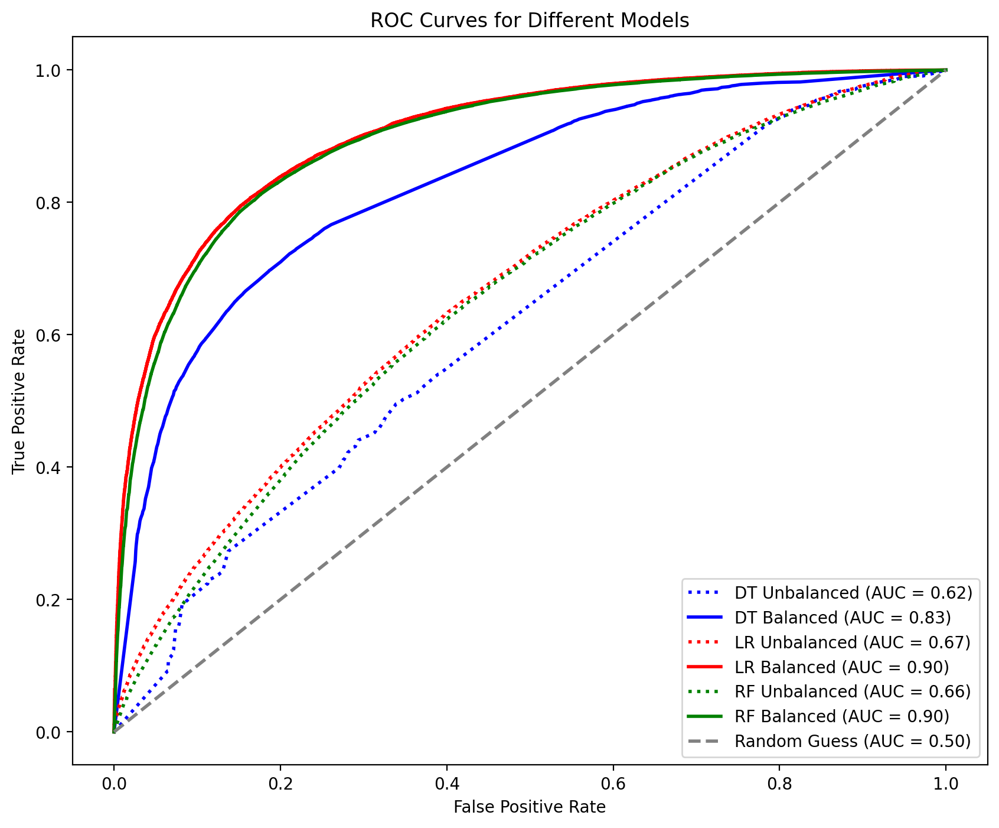

In [34]:
import matplotlib.pyplot as plt


# Plotting all the ROC curves
plt.figure(figsize=(10, 8))

# Decision Tree ROC curves
plt.plot(fpr_dt_unbal, tpr_dt_unbal, color='blue', lw=2, linestyle='dotted',
         label='DT Unbalanced (AUC = %0.2f)' % roc_auc_dt_unbal)
plt.plot(fpr_dt_bal, tpr_dt_bal, color='blue', lw=2, label='DT Balanced (AUC = %0.2f)' % roc_auc_dt_bal)

# Logistic Regression ROC curves
plt.plot(fpr_lr_unbal, tpr_lr_unbal, color='red', lw=2, linestyle='dotted',
         label='LR Unbalanced (AUC = %0.2f)' % roc_auc_lr_unbal)
plt.plot(fpr_lr_bal, tpr_lr_bal, color='red', lw=2, label='LR Balanced (AUC = %0.2f)' % roc_auc_lr_bal)

# Random Forest ROC curves
plt.plot(fpr_rf_unbal, tpr_rf_unbal, color='green', lw=2, linestyle='dotted',
         label='RF Unbalanced (AUC = %0.2f)' % roc_auc_rf_unbal)
plt.plot(fpr_rf_bal, tpr_rf_bal, color='green', lw=2, label='RF Balanced (AUC = %0.2f)' % roc_auc_rf_bal)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--', label='Random Guess (AUC = 0.50)')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Different Models')
plt.legend(loc="lower right")

plt.show()


In [52]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Assuming the data has been loaded previously as per the user's environment and available variables
# This code block will create an interactive Plotly plot using the provided matplotlib code as a reference

# Initialize figure with subplots
fig = make_subplots(rows=1, cols=1, shared_xaxes=True)

# Trace for the Decision Tree Unbalanced ROC Curve
trace_dt_unbal = go.Scatter(x=fpr_dt_unbal, y=tpr_dt_unbal,
                    mode='lines', name='DT Unbalanced (AUC = %.2f)' % roc_auc_dt_unbal,
                    line=dict(color='blue', dash='dot'))

# Trace for the Decision Tree Balanced ROC Curve
trace_dt_bal = go.Scatter(x=fpr_dt_bal, y=tpr_dt_bal,
                    mode='lines', name='DT Balanced (AUC = %.2f)' % roc_auc_dt_bal,
                    line=dict(color='blue'))

# Trace for the Logistic Regression Unbalanced ROC Curve
trace_lr_unbal = go.Scatter(x=fpr_lr_unbal, y=tpr_lr_unbal,
                    mode='lines', name='LR Unbalanced (AUC = %.2f)' % roc_auc_lr_unbal,
                    line=dict(color='red', dash='dot'))

# Trace for the Logistic Regression Balanced ROC Curve
trace_lr_bal = go.Scatter(x=fpr_lr_bal, y=tpr_lr_bal,
                    mode='lines', name='LR Balanced (AUC = %.2f)' % roc_auc_lr_bal,
                    line=dict(color='red'))

# Trace for the Random Forest Unbalanced ROC Curve
trace_rf_unbal = go.Scatter(x=fpr_rf_unbal, y=tpr_rf_unbal,
                    mode='lines', name='RF Unbalanced (AUC = %.2f)' % roc_auc_rf_unbal,
                    line=dict(color='black', dash='dot'))

# Trace for the Random Forest Balanced ROC Curve
trace_rf_bal = go.Scatter(x=fpr_rf_bal, y=tpr_rf_bal,
                    mode='lines', name='RF Balanced (AUC = %.2f)' % roc_auc_rf_bal,
                    line=dict(color='black'))

# Trace for Random Guess
trace_random = go.Scatter(x=[0, 1], y=[0, 1],
                    mode='lines', name='Random Guess (AUC = 0.50)',
                    line=dict(color='gray', dash='dash'))

# Add traces to the figure
fig.add_trace(trace_dt_unbal)
fig.add_trace(trace_dt_bal)
fig.add_trace(trace_lr_unbal)
fig.add_trace(trace_lr_bal)
fig.add_trace(trace_rf_unbal)
fig.add_trace(trace_rf_bal)
fig.add_trace(trace_random)

# Set plot layout
fig.update_layout(title_text='ROC Comparison of models',
                  xaxis_title='False Positive Rate',
                  yaxis_title='True Positive Rate',
                  legend_title_text='Model',
                  legend=dict(font=dict(size=10)),
                  width=900,  
                  height=700,
                  autosize=False)

# Convert to interactive plot and show
fig.show()


In [36]:
lg_unbal = joblib.load("../model/logreg_unbal_output_df.pkl")
lg_bal = joblib.load("../model/logreg_bal_output_df.pkl")

dt_unbal = joblib.load("../model/dt_unbal_output_df.pkl")
dt_bal = joblib.load("../model/dt_bal_output_df.pkl")
rf_unbal = joblib.load("../model/rf_unbal_output_df.pkl")
rf_bal = joblib.load("../model/rf_bal_output_df.pkl")

In [37]:
lg_unbal.rename(columns={'model_guess': 'lg_unbal_guess'}, inplace=True)
lg_bal.rename(columns={'model_guess': 'lg_bal_guess'}, inplace=True)


In [38]:
dt_unbal.rename(columns={'guess': 'dt_unbal_guess'}, inplace=True)
dt_bal.rename(columns={'guess': 'dt_bal_guess'}, inplace=True)


In [39]:
rf_unbal.rename(columns={'guess': 'rf_unbal_guess'}, inplace=True)
rf_bal.rename(columns={'guess': 'rf_bal_guess'}, inplace=True)


In [40]:
lg_unbal[lg_unbal.columns[:2]]

,actual,lg_unbal_guess
140610,0,1
685142,1,0
68902,0,1
339446,1,1
223051,0,1
...,...,...
679035,0,1
703799,0,1
45777,1,0
180393,0,1


In [41]:
pd.concat([lg_unbal[lg_unbal.columns[:2]], lg_bal["lg_bal_guess"]], axis=1)

,actual,lg_unbal_guess,lg_bal_guess
140610,0,1,0
685142,1,0,0
68902,0,1,1
339446,1,1,1
223051,0,1,0
...,...,...,...
679035,0,1,0
703799,0,1,0
45777,1,0,1
180393,0,1,0


In [42]:

guesses = pd.concat([lg_unbal[lg_unbal.columns[:2]], dt_unbal["dt_unbal_guess"],rf_unbal["rf_unbal_guess"],lg_bal["lg_bal_guess"], dt_bal["dt_bal_guess"], rf_bal["rf_bal_guess"]], axis=1)

In [43]:
guesses

,actual,lg_unbal_guess,dt_unbal_guess,rf_unbal_guess,lg_bal_guess,dt_bal_guess,rf_bal_guess
140610,0,1,1,1,0,0,0
685142,1,0,1,1,0,0,0
68902,0,1,1,1,1,1,1
339446,1,1,1,1,1,0,0
223051,0,1,1,1,0,0,0
...,...,...,...,...,...,...,...
679035,0,1,1,1,0,0,0
703799,0,1,0,0,0,0,0
45777,1,0,0,0,1,1,1
180393,0,1,1,1,0,0,0


In [44]:
guesses.corr()

,actual,lg_unbal_guess,dt_unbal_guess,rf_unbal_guess,lg_bal_guess,dt_bal_guess,rf_bal_guess
actual,1.000000,0.200651,0.178400,0.196091,0.577608,0.442462,0.568228
lg_unbal_guess,0.200651,1.000000,0.295127,0.575431,0.245628,0.191841,0.224185
dt_unbal_guess,0.178400,0.295127,1.000000,0.369098,0.201155,0.157305,0.208322
rf_unbal_guess,0.196091,0.575431,0.369098,1.000000,0.224332,0.190638,0.219942
lg_bal_guess,0.577608,0.245628,0.201155,0.224332,1.000000,0.600316,0.765799
dt_bal_guess,0.442462,0.191841,0.157305,0.190638,0.600316,1.000000,0.649307
rf_bal_guess,0.568228,0.224185,0.208322,0.219942,0.765799,0.649307,1.000000


<Axes: >

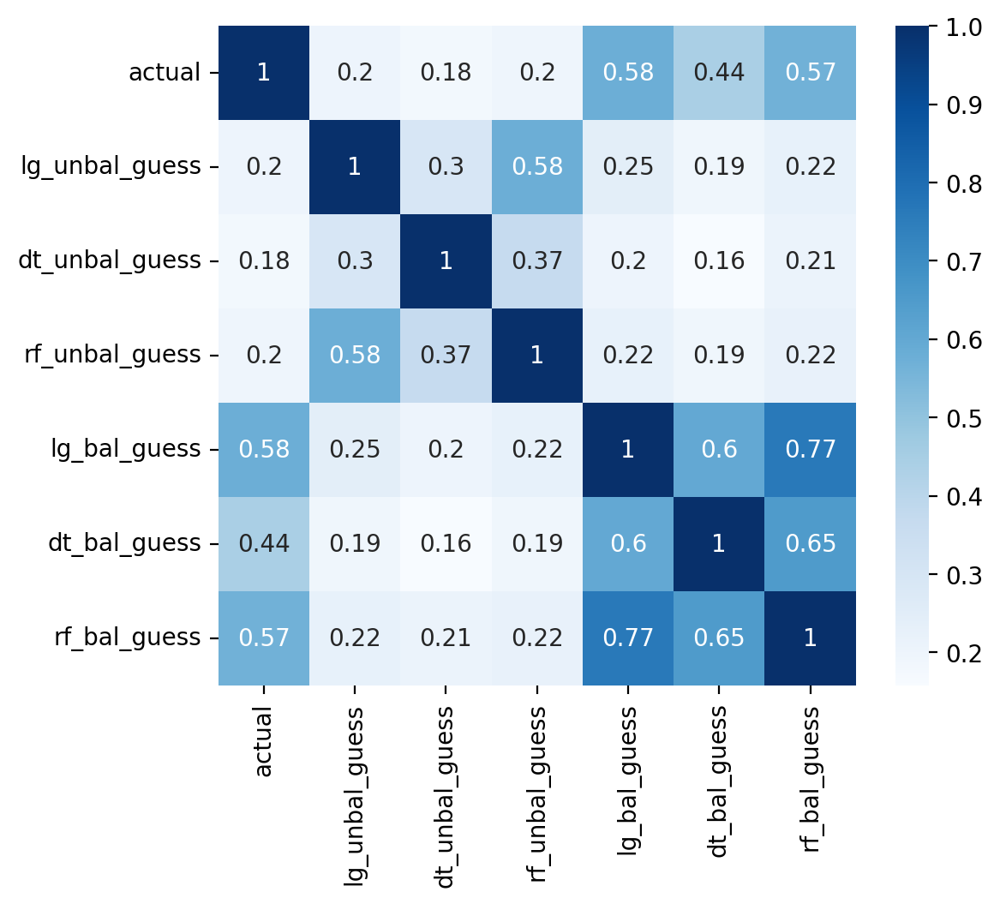

In [59]:
plt.figure(figsize=(6,5))
sns.heatmap(guesses.corr(), annot=True, cmap= "Blues")


We can see that the models trained on the balanced dataset output is more correlated to the actual value

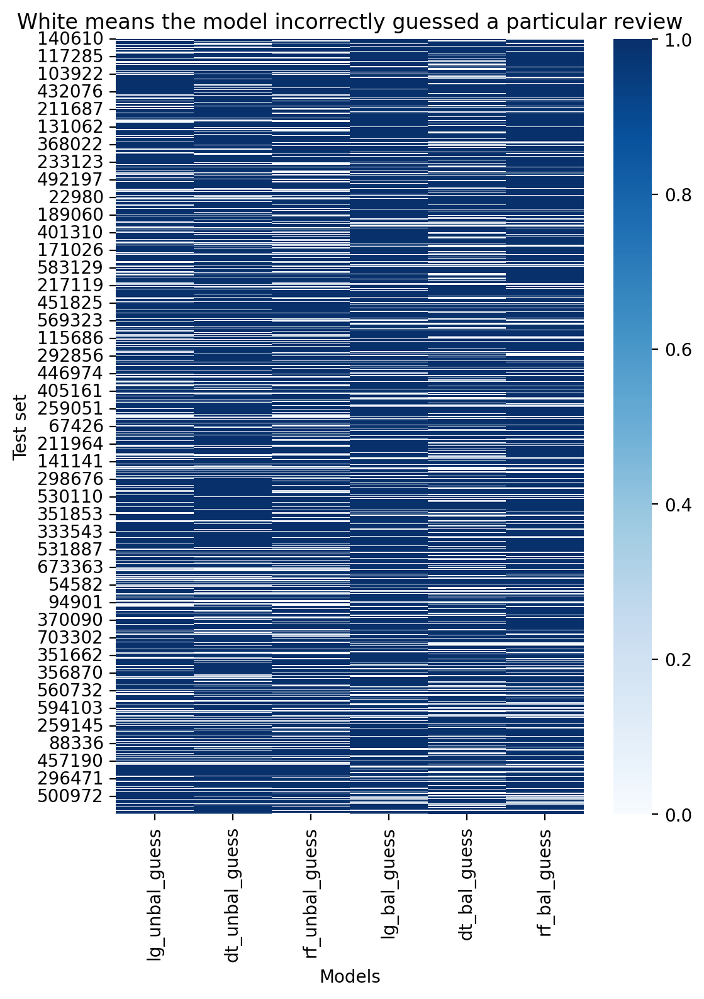

In [63]:
actual_labels = guesses.iloc[:, 0]
comparison_matrix = pd.DataFrame()
for model in guesses.columns[1:]:
    comparison_matrix[model] = guesses[model] == actual_labels

plt.figure(figsize=(6, 8))
sns.heatmap(comparison_matrix, cmap='Blues')
plt.title('White means the model incorrectly guessed a particular review')
plt.ylabel('Test set')
plt.xlabel('Models')
plt.show()

We can see that there are some reviews which all the models struggle to identify, and some where only particular models struggle. Again, we can see that overall the models trained on the balanced data got more right, and seem to perform similarly, as shown by the correlation heatmap below. The guesses of the unbalanced models are corelated to eachother somewhat, and the balanced models also exhibit this property.

<Axes: >

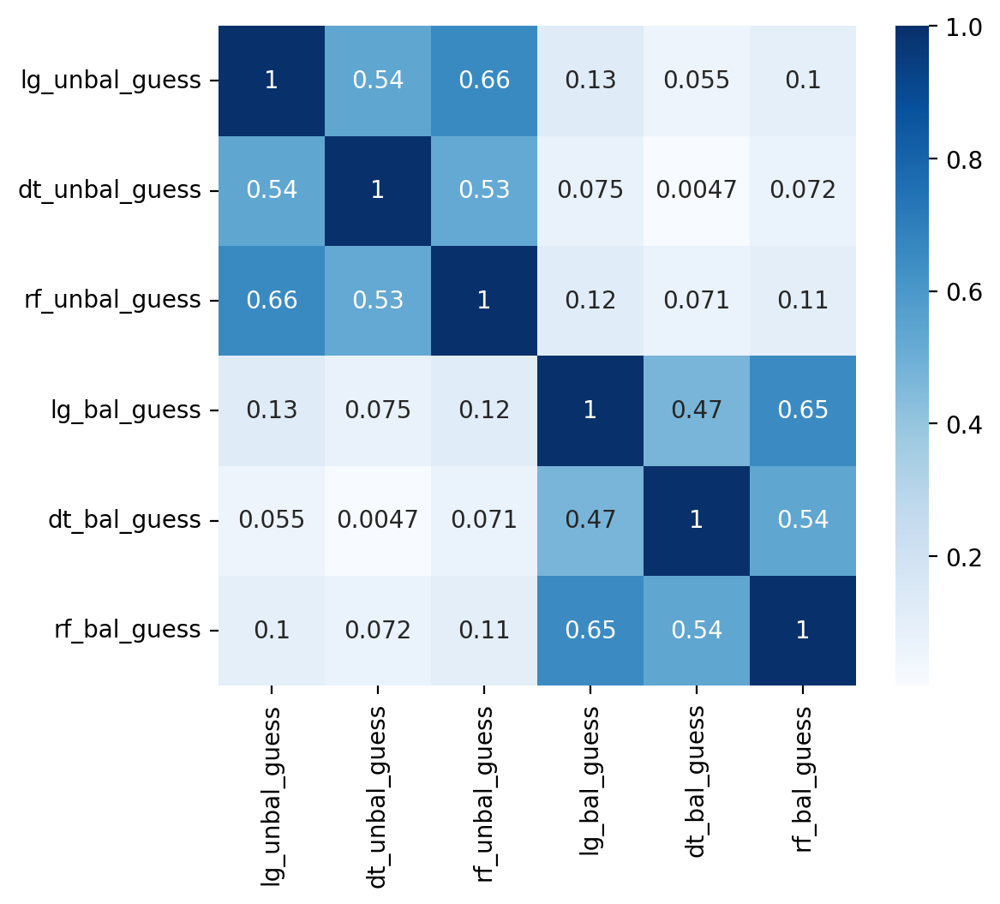

In [60]:
plt.figure(figsize=(6,5))

sns.heatmap(comparison_matrix.corr(), annot=True, cmap= "Blues")